In [1]:
from top2vec import Top2Vec
import json

def load_data(file):
    with open(file,"r",encoding="utf-8") as f:
        data = json.load(f)
    return data

segments = load_data("data/fulltexts_0_1376.json")['text']
file = "data/t2v_fulltext.model"
# model = Top2Vec(segments)
# model.save(file)

c:\Users\elvin\Documents\py\MP-PRU15\venv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
model = Top2Vec.load(file)
print(model.get_num_topics())

21


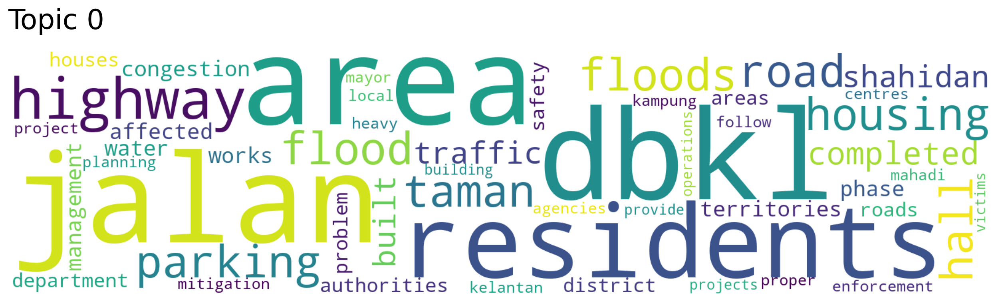

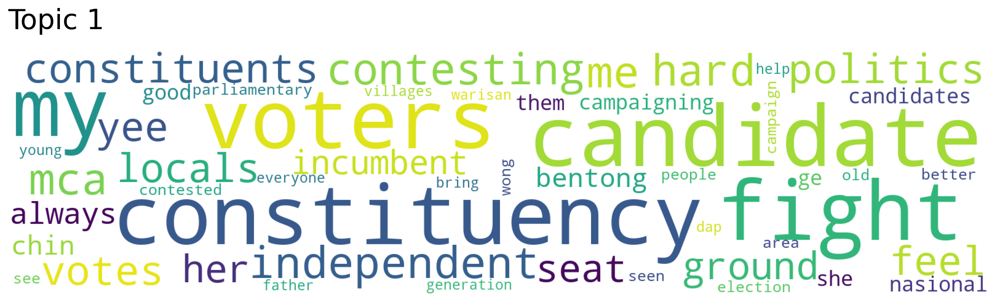

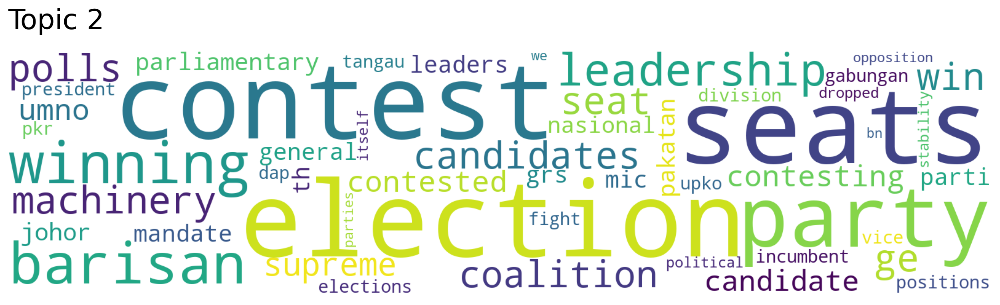

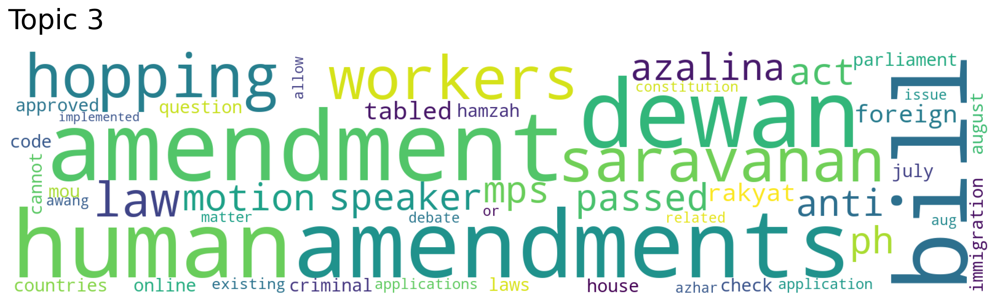

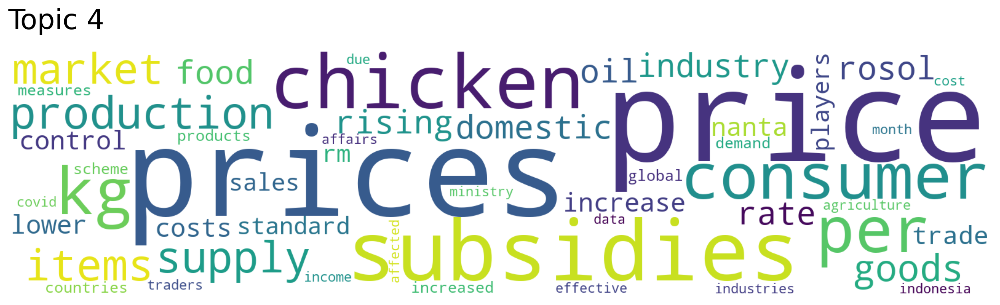

...

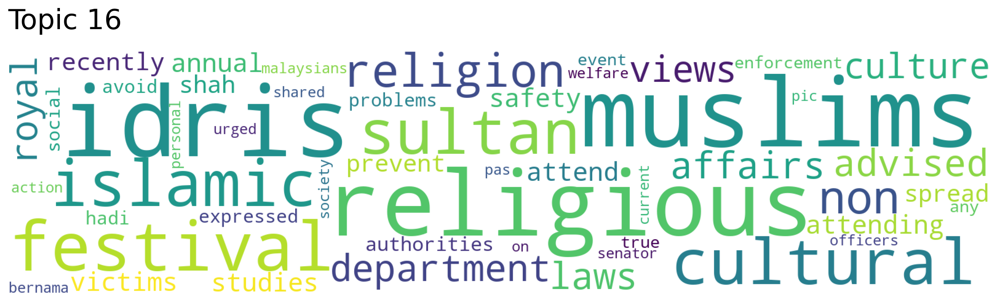

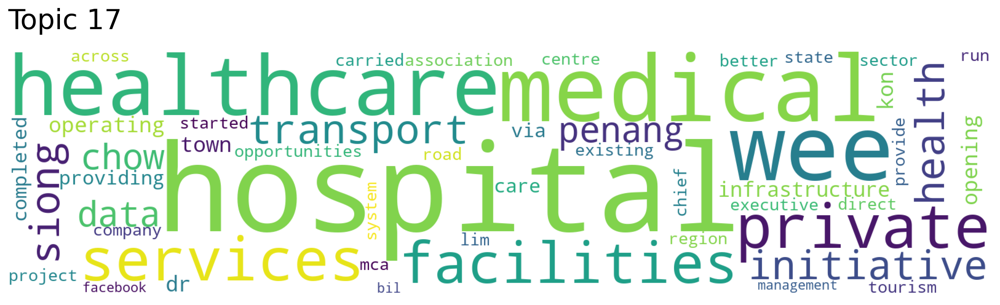

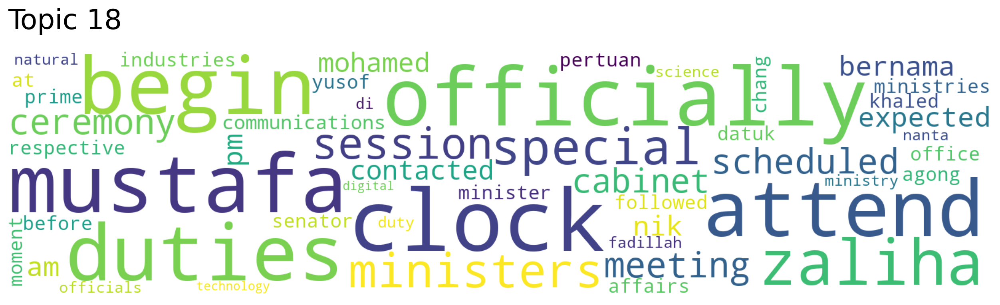

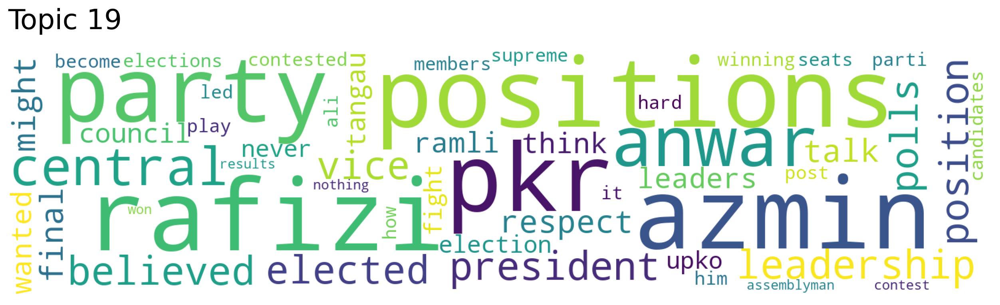

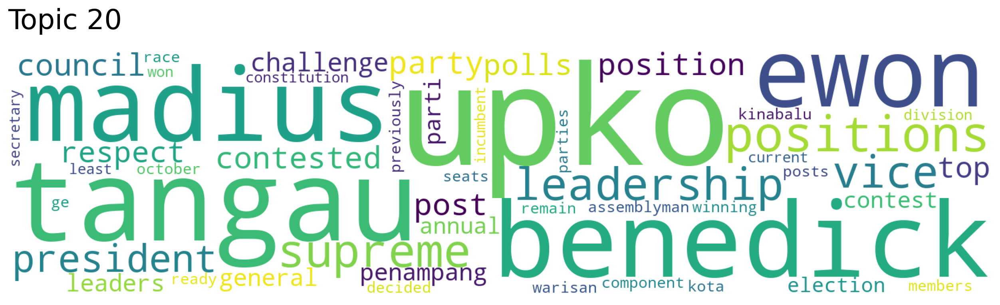

In [3]:
import matplotlib.pyplot as plt

topic_words, word_scores, topic_nums = model.get_topics()
for topic in topic_nums:
    model.generate_topic_wordcloud(topic,background_color ='white')
    plt.show()
    # plt.savefig(fname=f"img/medium-post-3/topic{topic:02d}.png")

In [4]:
import pandas as pd
# Manually name the topics
topic_names = list(enumerate([
    "Kuala Lumpur",
    "election",
    "election",
    "anti-hopping bill",
    "consumer price",
    "MA63",
    "foreign policy",
    "court cases",
    "tourism",
    "PAS",
    "LCS scandal",
    "election",
    "football world cup",
    "education",
    "prime minister",
    "COVID-19",
    "Islamic",
    "healtcare",
    "official duty",
    "PKR",
    "UPKO",
    ]))
pd.DataFrame(topic_names)

,0,1
0,0,Kuala Lumpur
1,1,election
2,2,election
3,3,anti-hopping bill
4,4,consumer price
5,5,MA63
6,6,foreign policy
7,7,court cases
8,8,tourism
9,9,PAS


In [5]:
segment_topic_ids = [
    model.get_documents_topics(doc_ids=[i,])[0][0]
    for i,_ in enumerate(segments)]
pd.DataFrame(segment_topic_ids)

,0
0,6
1,9
2,16
3,0
4,0
...,...
1371,8
1372,3
1373,4
1374,8


In [6]:
df_news = pd.read_pickle("data/20221206_news_df_with links.pkl")
df_news.head(2)

,title,url,pubDate,name
0,Zakri named foundation fellow of International...,https://news.google.com/__i/rss/rd/articles/CB...,"Sat, 11 Jun 2022 07:00:00 GMT",zakri hassan
0,Hadi: Perikatan to wait for next GE to 'topple...,https://news.google.com/__i/rss/rd/articles/CB...,"Mon, 05 Dec 2022 12:38:00 GMT",shahidan kassim


In [7]:
df_topics = (pd.DataFrame(segment_topic_ids)
                .join(pd.DataFrame(topic_names),on=0,lsuffix="_l")
                .drop(labels=["0_l","0"],axis=1)
                .reset_index(drop=True))
df_topics.head(2)

,1
0,foreign policy
1,PAS


In [8]:
df_names = df_news[['name']].reset_index(drop=True)
df_names.head(2)

,name
0,zakri hassan
1,shahidan kassim


In [9]:
import pandas as pd
# df_mp_topic_rels = df_names.join(df_topics)
# df_mp_topic_rels.columns = ["source","target"]
# df_mp_topic_rels['value'] = 1
# df_mp_topic_rels = df_mp_topic_rels.groupby(["source","target"],
#                                             sort=False,
#                                             as_index=False).sum()
# df_mp_topic_rels.to_pickle("data/20221214_df_mp_topic_rels.pkl")
df_mp_topic_rels = pd.read_pickle("data/20221214_df_mp_topic_rels.pkl")
df_mp_topic_rels

,source,target,value
0,zakri hassan,foreign policy,1
1,shahidan kassim,PAS,1
2,shahidan kassim,Islamic,2
3,shahidan kassim,Kuala Lumpur,15
4,shahidan kassim,football world cup,1
...,...,...,...
601,chiew choon man,election,1
602,datuk hasbi habibollah,education,1
603,datuk henry sum agong,tourism,3
604,datuk henry sum agong,anti-hopping bill,1


In [10]:
df_mp_topic_rels.sort_values('value',ascending=False)

,source,target,value
420,datuk seri dr noraini ahmad,education,18
131,idris ahmad,Islamic,18
68,tan sri abdul hadi awang,PAS,17
560,datuk seri nancy shukri,tourism,16
3,shahidan kassim,Kuala Lumpur,15
...,...,...,...
239,dzulkefly ahmad,LCS scandal,1
234,dzulkefly ahmad,official duty,1
233,hasnizan harun,election,1
232,ismail sabri yaakob,anti-hopping bill,1


In [11]:
import networkx as nx

# import matplotlib.pyplot as plt
# plt.style.use('seaborn-v0_8-muted')

# create the full graph
B = nx.Graph()
topic_set = set(df_topics[1].values.tolist())
name_set = set(df_names['name'].unique().tolist())
B.add_nodes_from(topic_set,bipartite=0)
B.add_nodes_from(name_set,bipartite=1)
B = nx.from_pandas_edgelist(df_mp_topic_rels,
                            source="source",
                            target="target",
                            edge_attr="value",
                            create_using=nx.Graph())


In [22]:
# set attributes partition where topic as 0 and name as 1
partition = {**{x:0 for x in topic_set},**{x:1 for x in name_set}}
nx.set_node_attributes(B,partition,'partition')

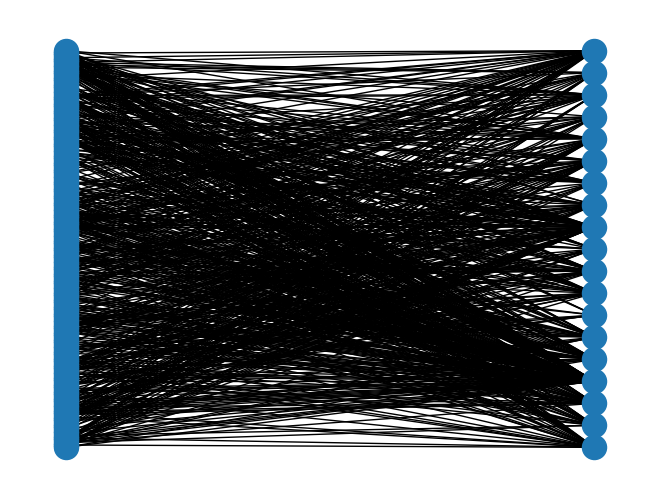

In [12]:
pos = nx.bipartite_layout(B, name_set)
nx.draw(B,pos=pos)

In [13]:
# create projected graphs on topic partition and name partition
from networkx.algorithms import bipartite
T = bipartite.weighted_projected_graph(B,topic_set)
N = bipartite.weighted_projected_graph(B,name_set)

In [14]:
from community import community_louvain
# Louvain Community Detection Algorithm is a simple method to extract the community structure of a network.
nx.set_node_attributes(T, community_louvain.best_partition(T), 'group')
nx.set_node_attributes(N, community_louvain.best_partition(N), 'group')

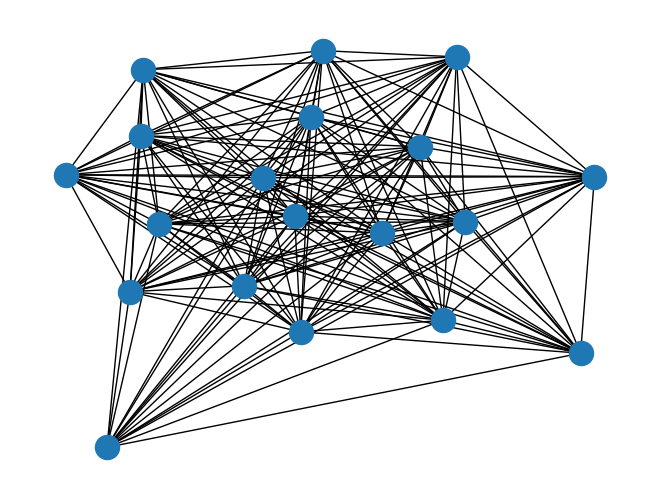

In [15]:
nx.draw(T)

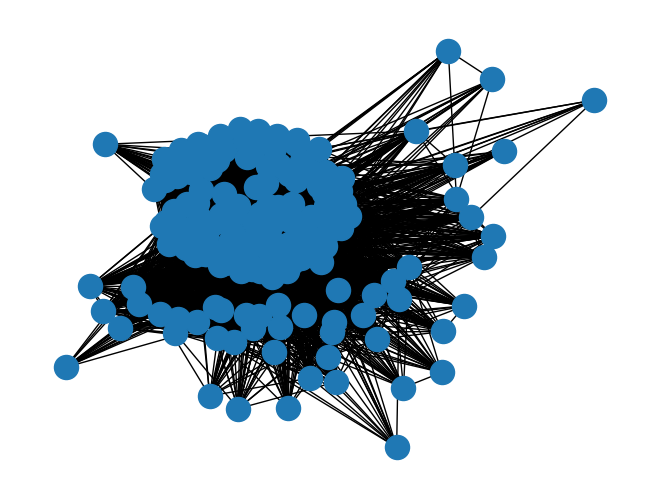

In [16]:
nx.draw(N)

In [19]:
from pyvis.network import Network
pname,graph = ("topic",T)
    
net = Network(
    notebook=True,
    width="1200px",
    height="800px",
    bgcolor="#222222",
    font_color='white')
net.from_nx(graph)
net.repulsion(node_distance=300,
            spring_length=100)
net.toggle_stabilization(True)
net.toggle_physics(True)
net.inherit_edge_colors(True)
net.show(f"output/20221219_partition_{pname}.html")

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


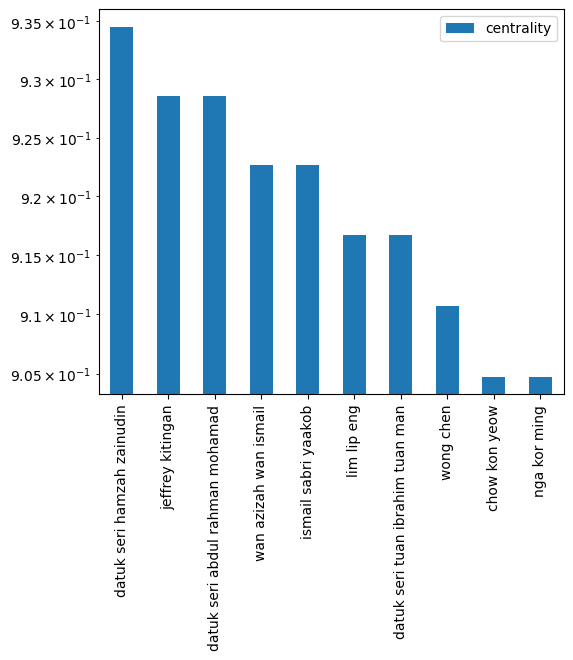

In [22]:
import matplotlib.pyplot as plt
# Degree centrality : The degree centrality for a node is simply its degree.
degree_dict = nx.degree_centrality(N)
degree_df = pd.DataFrame.from_dict(degree_dict,orient='index',columns=['centrality'])
degree_df.sort_values('centrality',ascending=False)[:10].plot(kind='bar',figsize=(6,5))
plt.yscale('log')
plt.show()

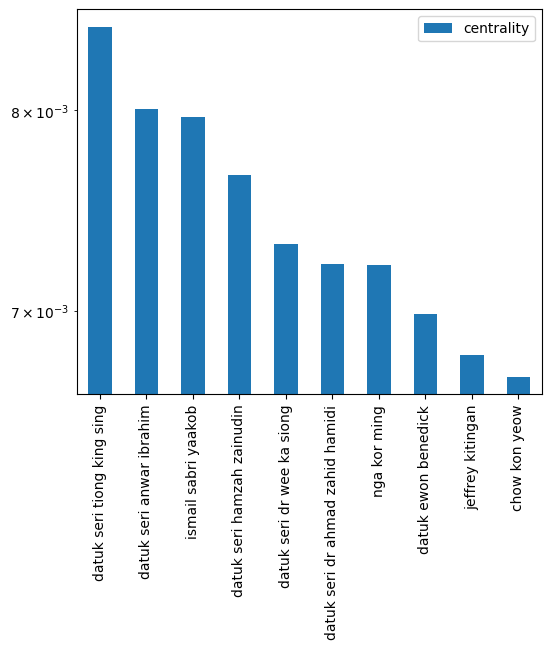

In [23]:
# Betweenness centrality is a widely used measure that captures a person's
# role in allowing information to pass from one part of the network to the other.
betweenness_dict = nx.betweenness_centrality(N)
betweenness_df = pd.DataFrame.from_dict(betweenness_dict,orient='index', columns=['centrality'])
betweenness_df.sort_values('centrality', ascending=False)[:10].plot(kind='bar',figsize=(6,5))
plt.yscale('log')
plt.show()

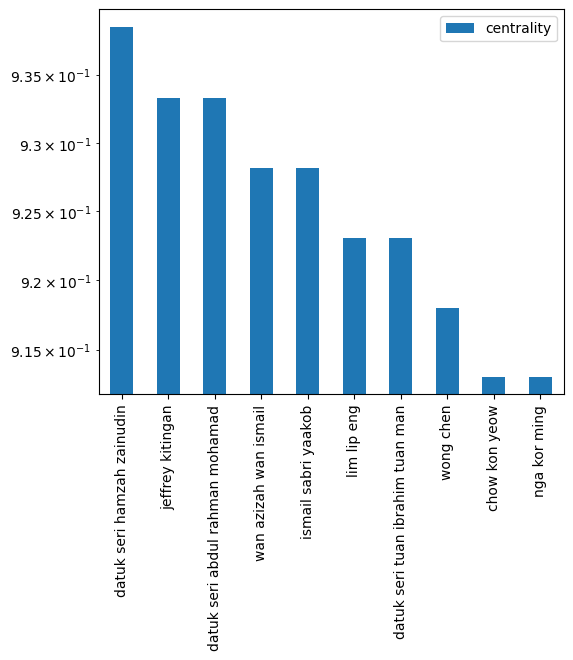

In [24]:
# closeness centrality : Closeness centrality indicates how close a node is to all other nodes in the network.
# It is calculated as the average of the shortest path length from the node to every other node in the network.
closeness_dict = nx.closeness_centrality(N)
closeness_df = pd.DataFrame.from_dict(closeness_dict, orient='index', columns=['centrality'])
closeness_df.sort_values('centrality', ascending=False)[:10].plot(kind='bar',figsize=(6,5))
plt.yscale('log')
plt.show()

In [73]:
groups = nx.get_node_attributes(N,'group')

In [85]:
pd.DataFrame([(value,key) for key, value in groups.items()],columns=['group','name'])

,group,name
0,0,radzi md jidin
1,1,roslan hashim
2,2,chang lih kang
3,2,wan razali wan nor
4,1,syerleena abdul rashid
...,...,...
164,1,hassan saad
165,0,datuk henry sum agong
166,1,tan kok wai
167,0,mustapha sakmud


In [26]:
B.get_edge_data("datuk seri dr noraini ahmad","education")

{'value': 18}

In [30]:
nx.node_connectivity(N)

9